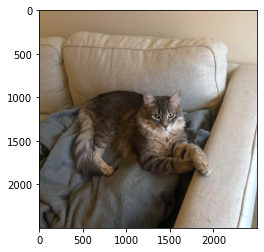

In [ ]:
import json
from typing import Any, Dict, List

import tensorflow as tf
from tensorflow import keras
import base64
import io
import os
import numpy as np
from PIL import Image

import tensorflow as tf
import torch
import imageio as iio
from matplotlib import image as mpimg
from matplotlib import pyplot as plt
import numpy as np
image = mpimg.imread("IMG_0232-2.jpg")
plt.imshow(image)
plt.show()

In [ ]:
import imageio


In [ ]:
import torch

In [ ]:
import cv2
import os
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import numpy as np
from google.colab.patches import cv2_imshow

faceCascade = cv2.CascadeClassifier("haarcascade_frontalface_alt2.xml")
model = load_model("mask_recog.h5")

def face_mask_detector(frame):
  # frame = cv2.imread(fileName)
  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
  faces = faceCascade.detectMultiScale(gray,
                                        scaleFactor=1.1,
                                        minNeighbors=5,
                                        minSize=(60, 60),
                                        flags=cv2.CASCADE_SCALE_IMAGE)
  faces_list=[]
  preds=[]
  for (x, y, w, h) in faces:
      face_frame = frame[y:y+h,x:x+w]
      face_frame = cv2.cvtColor(face_frame, cv2.COLOR_BGR2RGB)
      face_frame = cv2.resize(face_frame, (224, 224))
      face_frame = img_to_array(face_frame)
      face_frame = np.expand_dims(face_frame, axis=0)
      face_frame =  preprocess_input(face_frame)
      faces_list.append(face_frame)
      if len(faces_list)>0:
          preds = model.predict(faces_list)
      for pred in preds:
          (mask, withoutMask) = pred
      # label = "Mask" if mask > withoutMask else "No Mask"
      color = (0, 255, 0)# if label == "Mask" else (0, 0, 255)
      # label = "{}: {:.2f}%".format(label, max(mask, withoutMask) * 100)
      # cv2.putText(frame, label, (x, y- 10),
                  # cv2.FONT_HERSHEY_SIMPLEX, 1, color, 2)

      cv2.rectangle(frame, (x, y), (x + w, y + h),color, 3)
  # cv2_imshow(frame)
  return frame

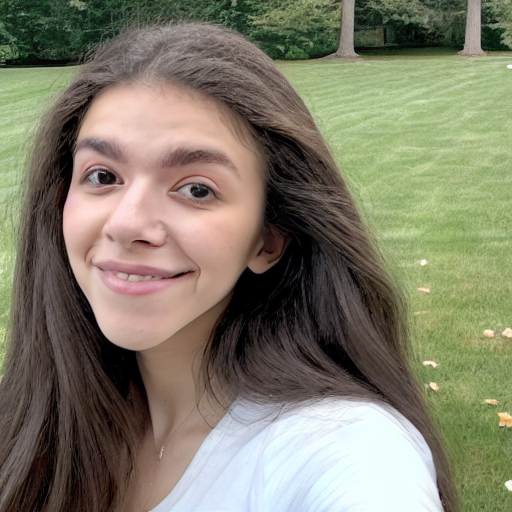

1/1 [==============================] - 0s 38ms/step


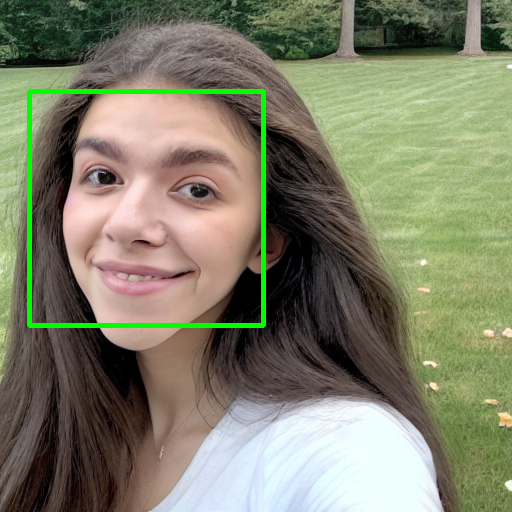

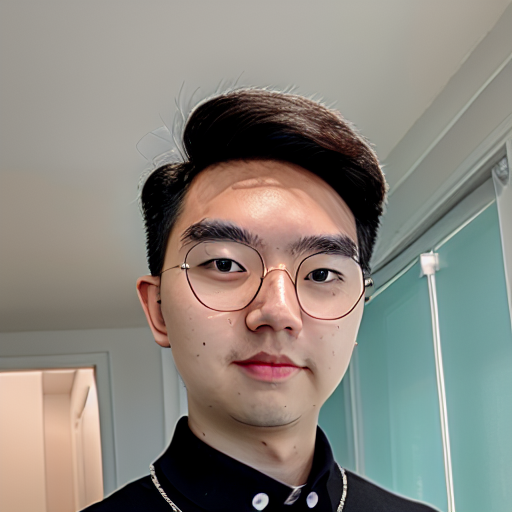

1/1 [==============================] - 0s 46ms/step


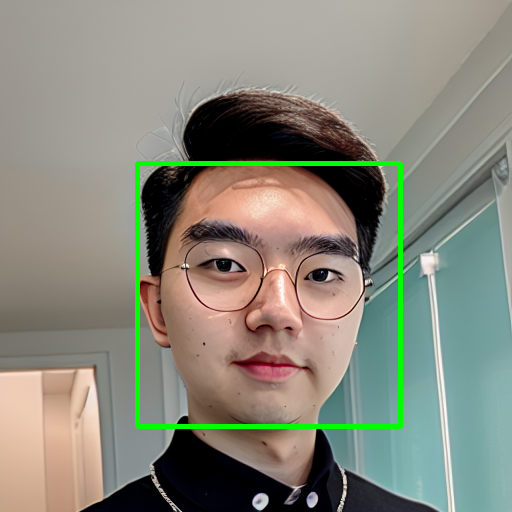

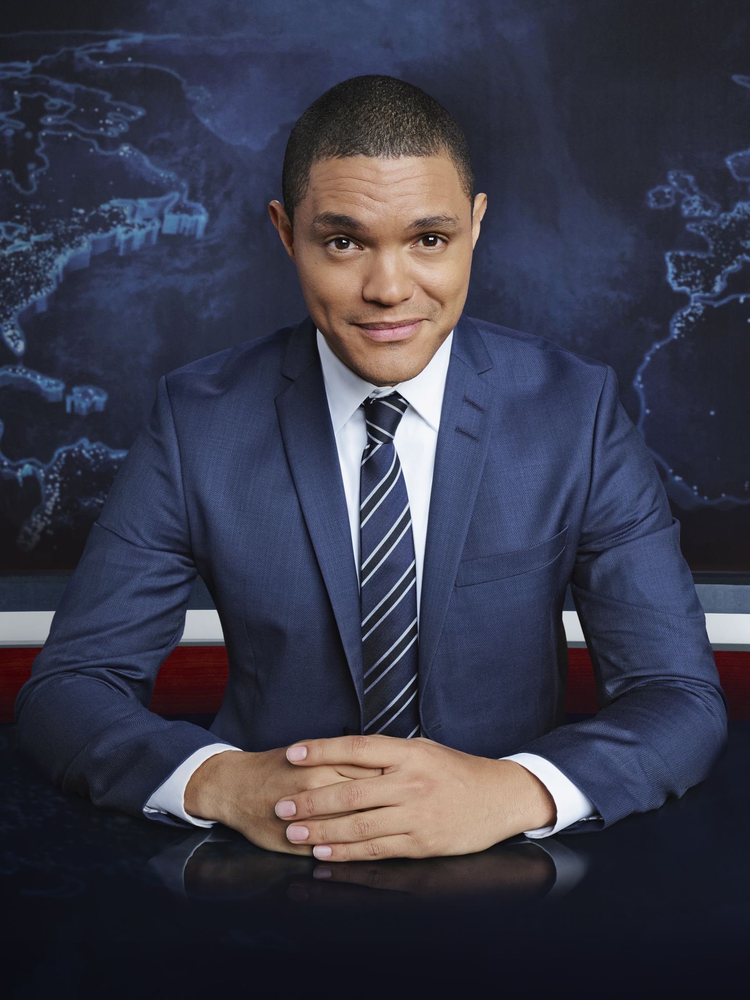

1/1 [==============================] - 0s 55ms/step


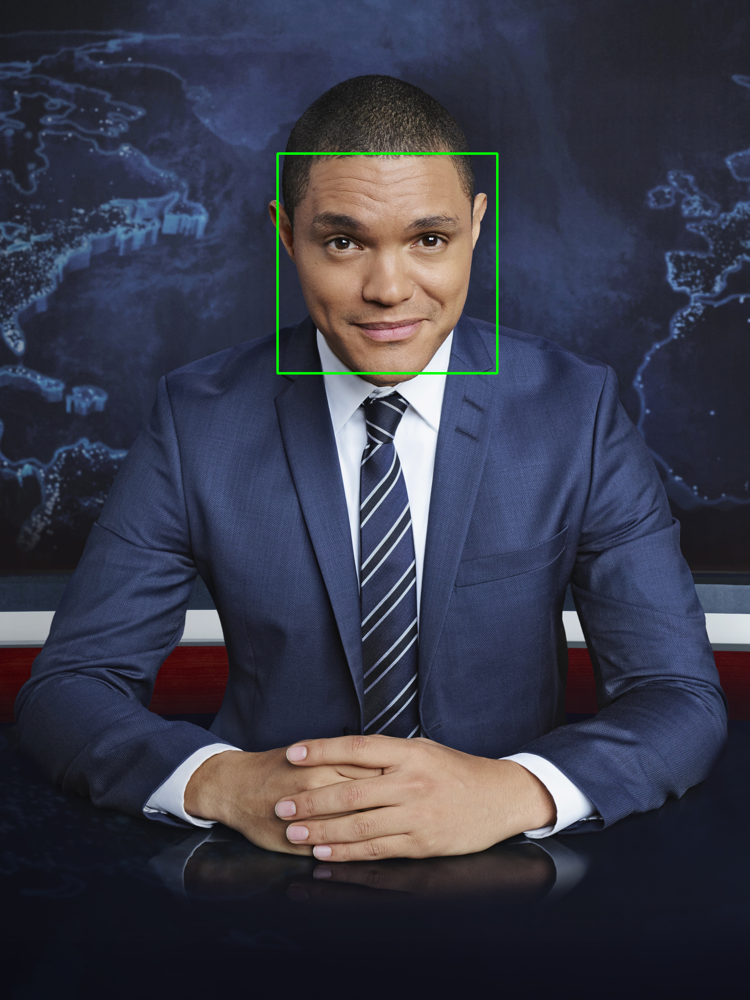

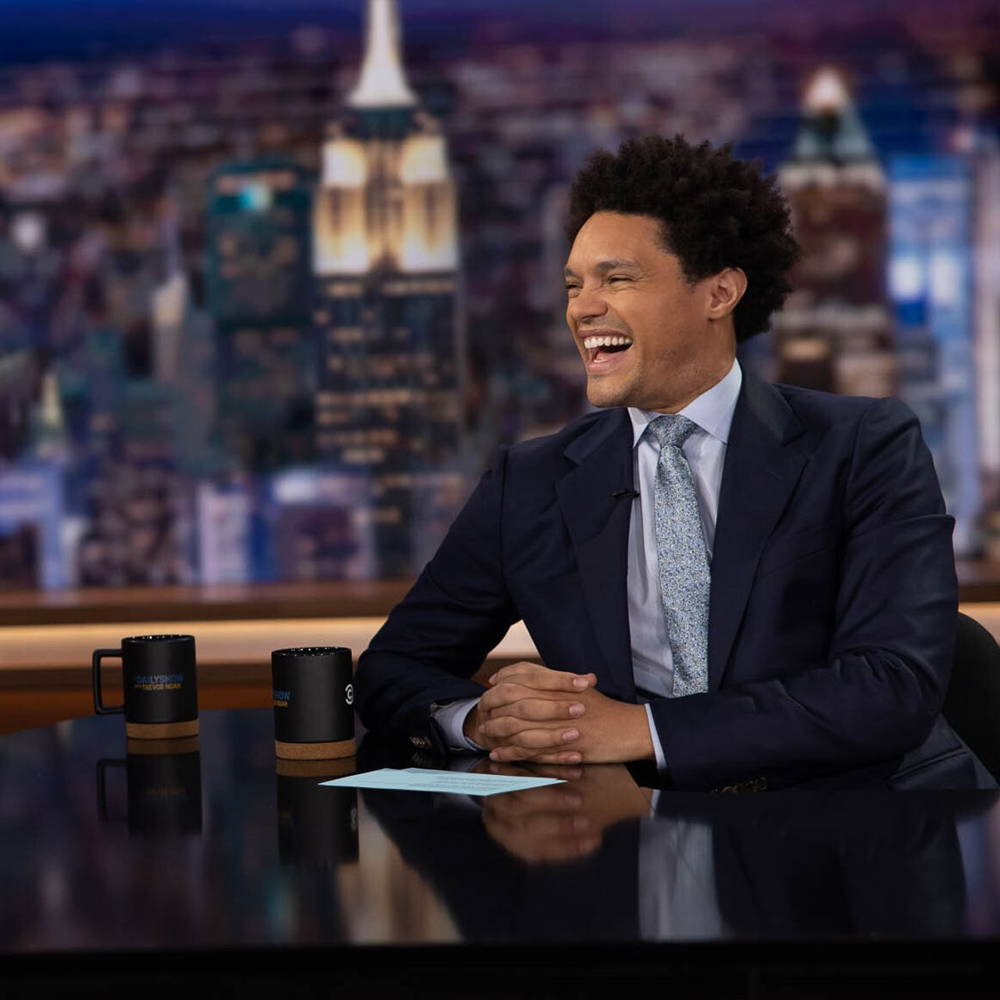

1/1 [==============================] - 0s 53ms/step


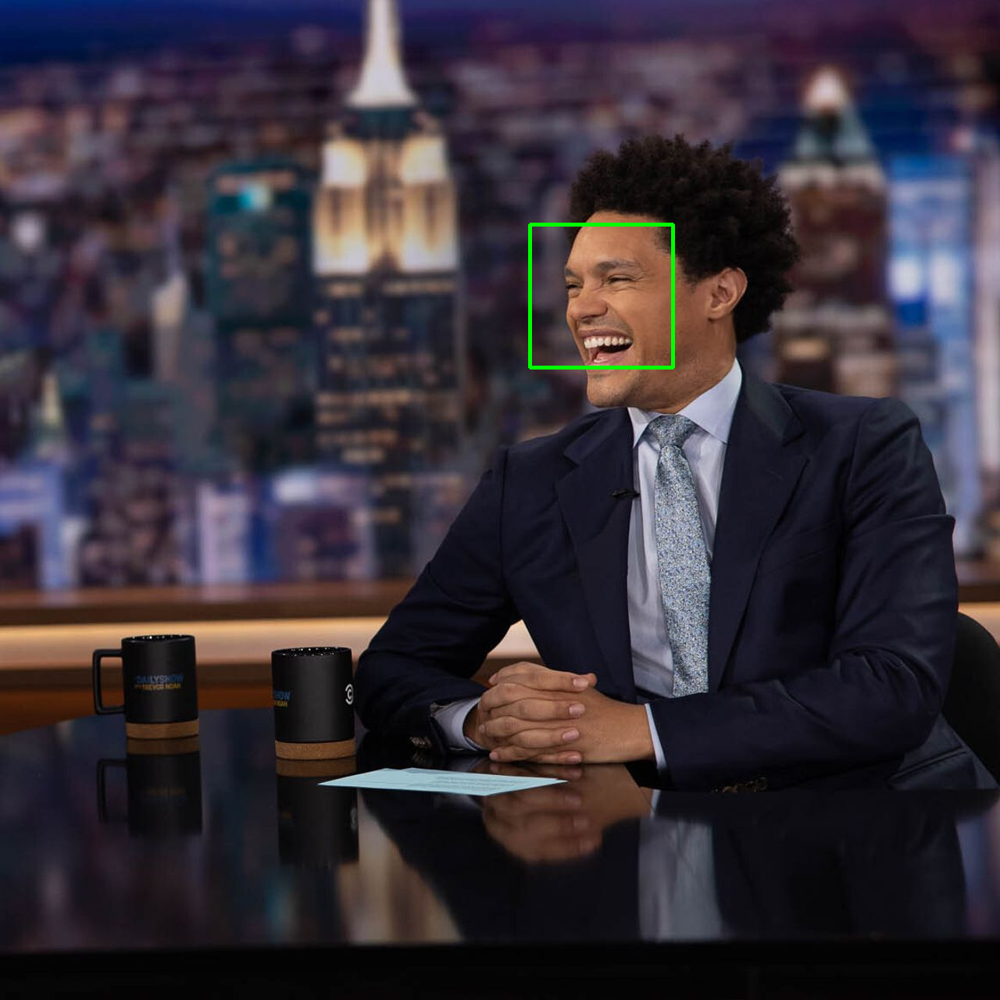

In [ ]:
images_ = [ 'person/vitoria1.png', 'person/nemo1.png',
           'person/trevor_noah1.png',
           'person/trevor_noah4.png'] 
for i in images_:
  input_image = cv2.imread(i)
  cv2_imshow(input_image)
  output = face_mask_detector(input_image)
  cv2_imshow(output)

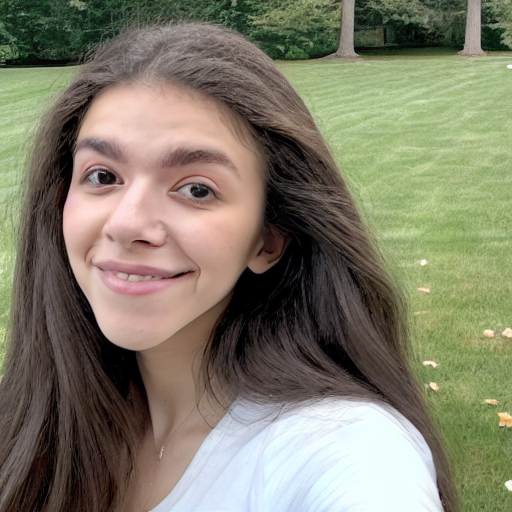

1/1 [==============================] - 0s 44ms/step


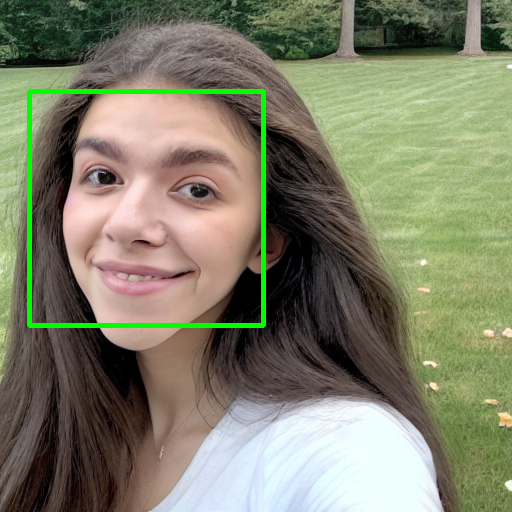

In [ ]:
input_image = cv2.imread("person/vitoria1.png")
cv2_imshow(input_image)
output = face_mask_detector(input_image)
cv2_imshow(output)

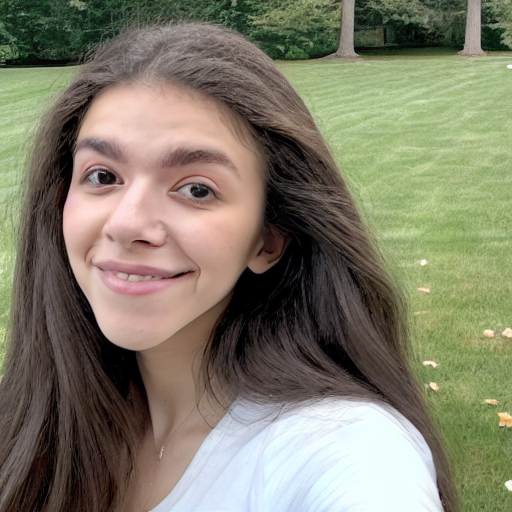

1/1 [==============================] - 0s 57ms/step


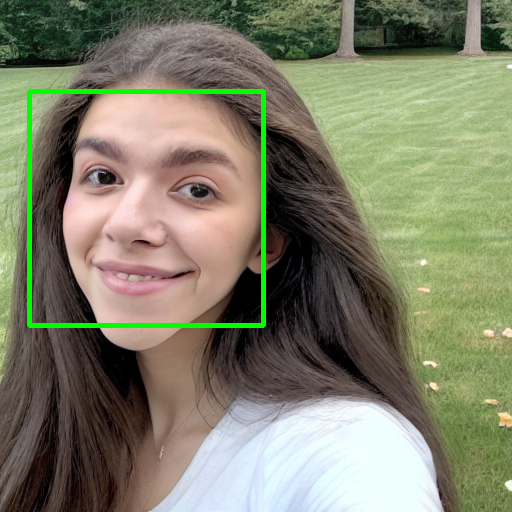

In [ ]:
images_ = [ 'person/vitoria1.png', 'person/nemo1.png']

input_image = cv2.imread(images_[0])
cv2_imshow(input_image)
output = face_mask_detector(input_image)
cv2_imshow(output)

In [ ]:
np.save('image_vitoria', input_image)

In [ ]:
np.save('box_vitoria', output)

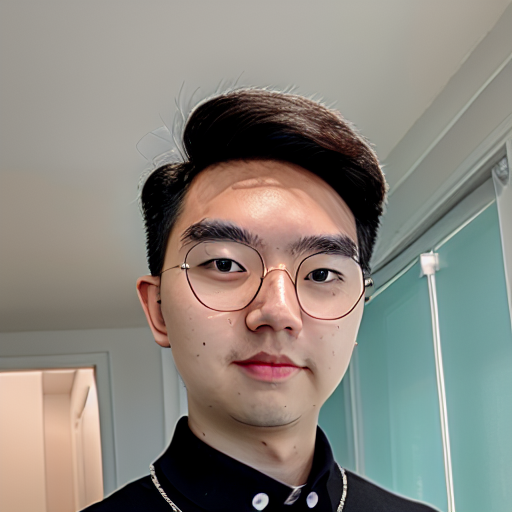

1/1 [==============================] - 0s 44ms/step


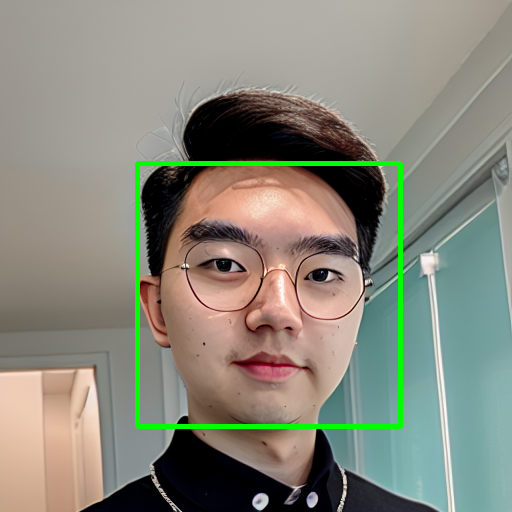

In [ ]:
images_ = [ 'person/vitoria1.png', 'person/nemo1.png']

input_image = cv2.imread(images_[1])
cv2_imshow(input_image)
output = face_mask_detector(input_image)
cv2_imshow(output)

In [ ]:
np.save('image_nemo', input_image)

In [ ]:
np.save('box_nemo', output)